
Emergency response times based on the locations of emergency lines, crime locations, vehicular crashes and fire accidents with real-time traffic data.

# Install and Import Dependencies

In [3]:
%pip install osmnx  #Installing Library

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



ERROR: Invalid requirement: '#Installing'


In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import osmnx as ox
import networkx as nx
import geopandas as gpd
from shapely.geometry import Point, Polygon, box, MultiPoint
import momepy #we need this lib to easily convert gdf to nx graphs
import urllib.request
from collections import Counter

# Building the Graph

Get City Graph

In [5]:
place_name= 'New York, United States'
G = ox.graph_from_place(place_name, network_type='drive', simplify=True) #network types: walk, drive, bike, drive_service, all, all_private

Convert to Dataframe

In [7]:
#Retrieve nodes and edges from the graph
nodes, edges = ox.graph_to_gdfs(G)

Get Boundary

In [8]:
area = ox.geocode_to_gdf(place_name)
area

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTIPOLYGON (((-74.25884 40.49887, -74.25814 ...",40.91763,40.476578,-73.700233,-74.258843,390059406,relation,175905,40.712728,-74.006015,boundary,administrative,10,0.817577,city,New York,"New York, United States"


Plot City Graph

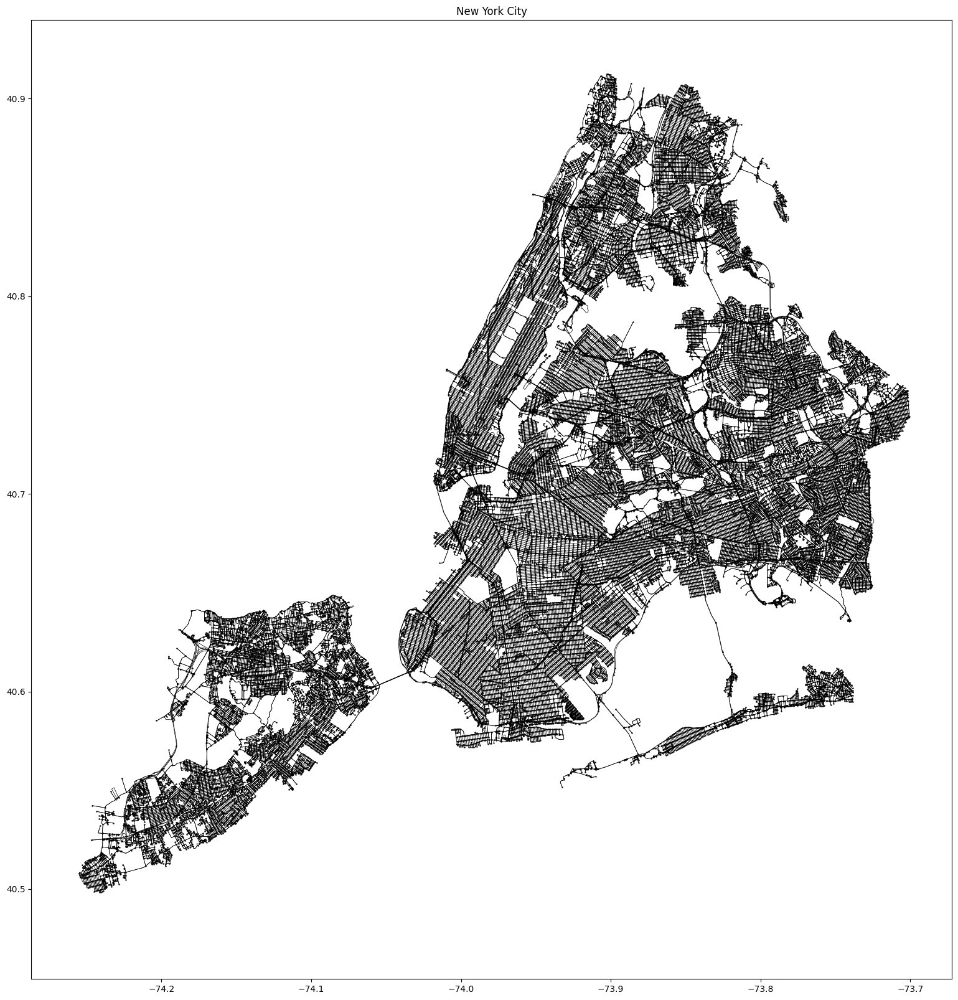

In [9]:
fig, ax = plt.subplots(figsize=(20,20))
area.plot(ax=ax, facecolor='White')
edges.plot(ax=ax, linewidth=0.5, edgecolor='Black')
nodes.plot(ax=ax, color='Black', markersize=0.5)
plt.title("New York City")
plt.show()

# Assigning Features to Nodes/Edges

## Feature 1 - Emergency Lines - Amenities

Plotting fire stations, ranger stations, police stations and hospitals.
https://wiki.openstreetmap.org/wiki/Map_features

In [10]:
key = "amenity" #from wiki-osm
value = ["fire_station","ranger_station","police","hospital"]

# Download the Points of interest
tags = {key: value}
gdf = ox.features.features_from_place(place_name, tags=tags)
gdf

geometry  \
element_type osmid                                                           
node         357571909                          POINT (-73.87984 40.88009)   
             357607640                          POINT (-73.83883 40.84647)   
             357607688                          POINT (-73.93226 40.78653)   
             357611253                          POINT (-73.88140 40.88036)   
             357616245                          POINT (-73.92791 40.78515)   
...                                                                    ...   
way          1019402416  POLYGON ((-73.80765 40.71849, -73.80686 40.718...   
             1265948117  POLYGON ((-73.94446 40.76969, -73.94376 40.769...   
relation     3364740     POLYGON ((-73.91736 40.70463, -73.91739 40.704...   
             15507604    MULTIPOLYGON (((-74.19836 40.51679, -74.19721 ...   
             16312917    POLYGON ((-73.70549 40.75906, -73.70531 40.759...   

                              amenity  \
element_type osmid                      
node         357571909       hospital   
             357607640       hospital   
             357607688       hospital   
             357611253       hospital   
             357616245       hospital   
...                               ...   
way          1019402416  fire_station   
             1265948117      hospital   
relation     3364740         hospital   
             15507604        hospital   
             16312917        hospital   

                                                                      name  \
element_type osmid                                                           
node         357571909   Montefiore Medical Center West Campus Moses Di...   
             357607640        New York City Children's Center Bronx Campus   
             357607688                   Kirby Forensic Psychiatric Center   
             357611253                        North Central Bronx Hospital   
             357616245                George Rosenfeld Center for Recovery   
...                                                                    ...   
way          1019402416                                FDNY EMS Station 50   
             1265948117                       NYC Health + Hospitals/Coler   
relation     3364740                        Wyckoff Heights Medical Center   
             15507604              Staten Island University Hospital South   
             16312917                    Long Island Jewish Medical Center   

                                addr:city addr:housenumber addr:postcode  \
element_type osmid                                                         
node         357571909              Bronx              111         10467   
             357607640              Bronx             1300         10461   
             357607688       Wards Island              600         10029   
             357611253              Bronx             3424         10467   
             357616245           New York               13         10029   
...                                   ...              ...           ...   
way          1019402416           Jamaica           159-10         11432   
             1265948117  Roosevelt Island              900         10044   
relation     3364740             Brooklyn              374         11237   
             15507604       Staten Island              375         10309   
             16312917           Glen Oaks           270-05         11040   

                               addr:street beds          emergency  \
element_type osmid                                                   
node         357571909   East 210th Street  726                yes   
             357607640        Waters Place  NaN                 no   
             357607688   East 125th Street  NaN                 no   
             357611253      Kossuth Avenue  NaN                yes   
             357616245    Hell Gate Circle  231                 no   
...                    

In [11]:
ngdf = gdf.copy()
ngdf["geometry"] = ngdf["geometry"].centroid
ngdf

C:\Users\pingn\AppData\Local\Temp\ipykernel_12024\4086100497.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ngdf["geometry"] = ngdf["geometry"].centroid


geometry       amenity  \
element_type osmid                                                  
node         357571909   POINT (-73.87984 40.88009)      hospital   
             357607640   POINT (-73.83883 40.84647)      hospital   
             357607688   POINT (-73.93226 40.78653)      hospital   
             357611253   POINT (-73.88140 40.88036)      hospital   
             357616245   POINT (-73.92791 40.78515)      hospital   
...                                             ...           ...   
way          1019402416  POINT (-73.80721 40.71850)  fire_station   
             1265948117  POINT (-73.94228 40.77037)      hospital   
relation     3364740     POINT (-73.91768 40.70411)      hospital   
             15507604    POINT (-74.19657 40.51692)      hospital   
             16312917    POINT (-73.70713 40.75525)      hospital   

                                                                      name  \
element_type osmid                                                           
node         357571909   Montefiore Medical Center West Campus Moses Di...   
             357607640        New York City Children's Center Bronx Campus   
             357607688                   Kirby Forensic Psychiatric Center   
             357611253                        North Central Bronx Hospital   
             357616245                George Rosenfeld Center for Recovery   
...                                                                    ...   
way          1019402416                                FDNY EMS Station 50   
             1265948117                       NYC Health + Hospitals/Coler   
relation     3364740                        Wyckoff Heights Medical Center   
             15507604              Staten Island University Hospital South   
             16312917                    Long Island Jewish Medical Center   

                                addr:city addr:housenumber addr:postcode  \
element_type osmid                                                         
node         357571909              Bronx              111         10467   
             357607640              Bronx             1300         10461   
             357607688       Wards Island              600         10029   
             357611253              Bronx             3424         10467   
             357616245           New York               13         10029   
...                                   ...              ...           ...   
way          1019402416           Jamaica           159-10         11432   
             1265948117  Roosevelt Island              900         10044   
relation     3364740             Brooklyn              374         11237   
             15507604       Staten Island              375         10309   
             16312917           Glen Oaks           270-05         11040   

                               addr:street beds          emergency  \
element_type osmid                                                   
node         357571909   East 210th Street  726                yes   
             357607640        Waters Place  NaN                 no   
             357607688   East 125th Street  NaN                 no   
             357611253      Kossuth Avenue  NaN                yes   
             357616245    Hell Gate Circle  231                 no   
...                                    ...  ...                ...   
way          1019402416    Goethals Avenue  NaN  ambulance_station   
             1265948117        Main Street  NaN                NaN   
relation     3364740      Stockholm Street  350                yes   
             15507604       Seguine Avenue  NaN                yes   
             16312917          76th Avenue  NaN                yes   

                        gnis:feature_id  ... addr:housename roof:colour  \
element_type osmid                       ...                              
node         357571909           957548  ...            NaN         NaN   
     

In [12]:
point_count = len(ngdf[ngdf.geometry.geom_type == 'Point'])
polygon_count = len(ngdf[ngdf.geometry.geom_type == 'Polygon'])

print("Number of point geometries:", point_count)
print("Number of polygon geometries:", polygon_count)

Number of point geometries: 528
Number of polygon geometries: 0


In [13]:
# Filter out non-points geometry
ngdf_pts = ngdf.loc[ngdf.geometry.geometry.type=='Point']
ngdf_pts.shape
ngdf_pts

geometry       amenity  \
element_type osmid                                                  
node         357571909   POINT (-73.87984 40.88009)      hospital   
             357607640   POINT (-73.83883 40.84647)      hospital   
             357607688   POINT (-73.93226 40.78653)      hospital   
             357611253   POINT (-73.88140 40.88036)      hospital   
             357616245   POINT (-73.92791 40.78515)      hospital   
...                                             ...           ...   
way          1019402416  POINT (-73.80721 40.71850)  fire_station   
             1265948117  POINT (-73.94228 40.77037)      hospital   
relation     3364740     POINT (-73.91768 40.70411)      hospital   
             15507604    POINT (-74.19657 40.51692)      hospital   
             16312917    POINT (-73.70713 40.75525)      hospital   

                                                                      name  \
element_type osmid                                                           
node         357571909   Montefiore Medical Center West Campus Moses Di...   
             357607640        New York City Children's Center Bronx Campus   
             357607688                   Kirby Forensic Psychiatric Center   
             357611253                        North Central Bronx Hospital   
             357616245                George Rosenfeld Center for Recovery   
...                                                                    ...   
way          1019402416                                FDNY EMS Station 50   
             1265948117                       NYC Health + Hospitals/Coler   
relation     3364740                        Wyckoff Heights Medical Center   
             15507604              Staten Island University Hospital South   
             16312917                    Long Island Jewish Medical Center   

                                addr:city addr:housenumber addr:postcode  \
element_type osmid                                                         
node         357571909              Bronx              111         10467   
             357607640              Bronx             1300         10461   
             357607688       Wards Island              600         10029   
             357611253              Bronx             3424         10467   
             357616245           New York               13         10029   
...                                   ...              ...           ...   
way          1019402416           Jamaica           159-10         11432   
             1265948117  Roosevelt Island              900         10044   
relation     3364740             Brooklyn              374         11237   
             15507604       Staten Island              375         10309   
             16312917           Glen Oaks           270-05         11040   

                               addr:street beds          emergency  \
element_type osmid                                                   
node         357571909   East 210th Street  726                yes   
             357607640        Waters Place  NaN                 no   
             357607688   East 125th Street  NaN                 no   
             357611253      Kossuth Avenue  NaN                yes   
             357616245    Hell Gate Circle  231                 no   
...                                    ...  ...                ...   
way          1019402416    Goethals Avenue  NaN  ambulance_station   
             1265948117        Main Street  NaN                NaN   
relation     3364740      Stockholm Street  350                yes   
             15507604       Seguine Avenue  NaN                yes   
             16312917          76th Avenue  NaN                yes   

                        gnis:feature_id  ... addr:housename roof:colour  \
element_type osmid                       ...                              
node         357571909           957548  ...            NaN         NaN   
     

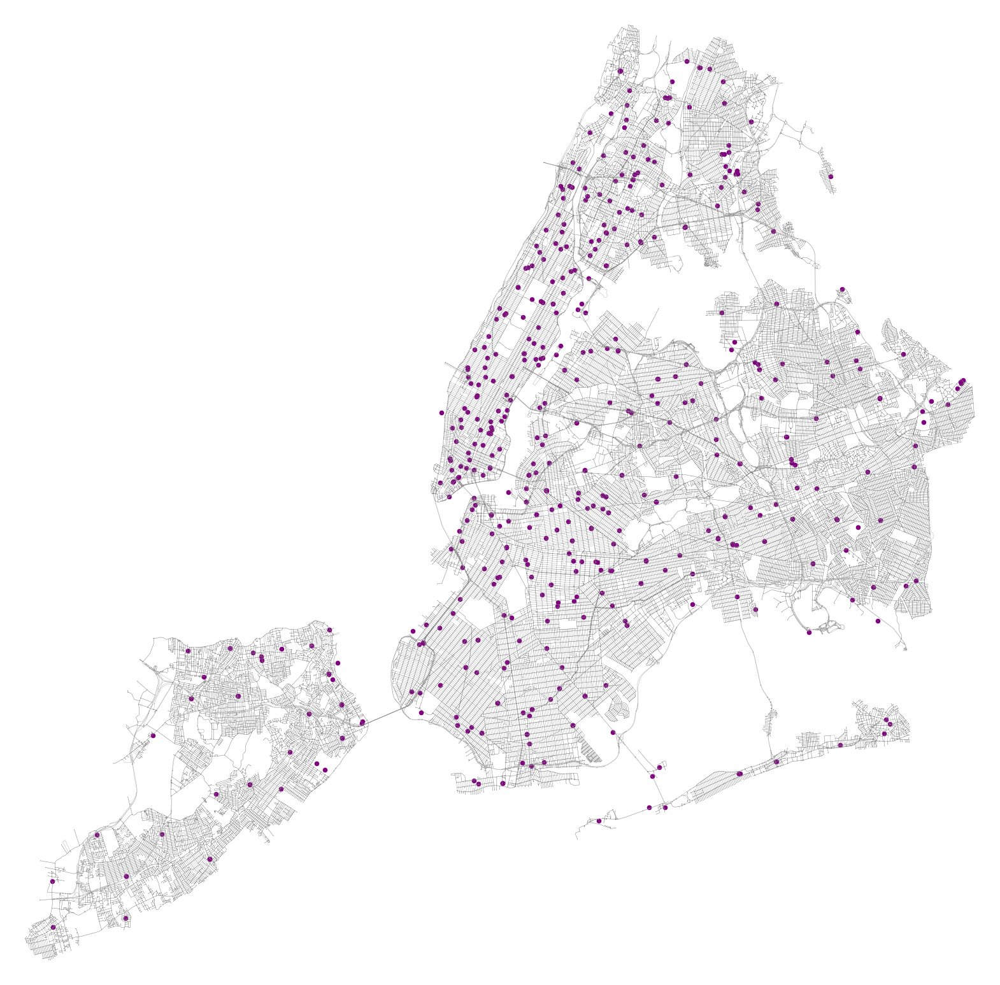

In [14]:
# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))
# Plot GeoDataFrame
ngdf_pts.plot(ax=ax, color='purple', markersize=20)
ox.plot_graph(G, ax=ax, node_size=0.5, node_color= "grey", edge_linewidth=0.2, edge_color='grey')
# Draw the graph
plt.show()

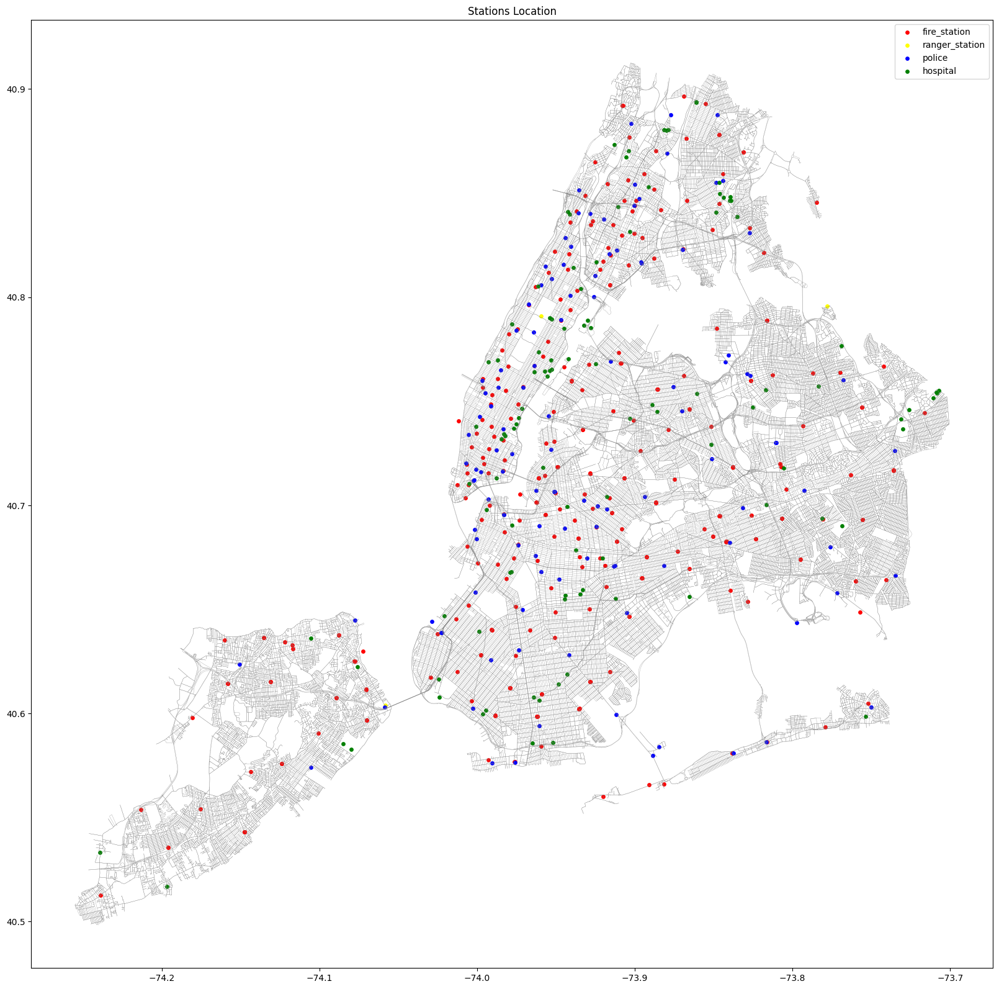

In [15]:
filtered_gdf_fire_station = ngdf_pts[ngdf_pts['amenity'] == 'fire_station']
filtered_gdf_ranger_station = ngdf_pts[ngdf_pts['amenity'] == 'ranger_station']
filtered_gdf_police = ngdf_pts[ngdf_pts['amenity'] == 'police']
filtered_gdf_hospital = ngdf_pts[ngdf_pts['amenity'] == 'hospital']

nodes, edges = ox.graph_to_gdfs(G) # extract edges

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
filtered_gdf_fire_station.plot(ax=ax, color='red', markersize=15, label='fire_station')
filtered_gdf_ranger_station.plot(ax=ax, color='yellow', markersize=15, label='ranger_station')
filtered_gdf_police.plot(ax=ax, color='blue', markersize=15, label='police')
filtered_gdf_hospital.plot(ax=ax, color='green', markersize=15, label='hospital')

# Plot the road network
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Stations Location")
plt.legend()
plt.show()

## Feature 2  - Crime Locations

https://data.cityofnewyork.us/Public-Safety/NYPD-Complaint-Data-Current-Year-To-Date-/5uac-w243/about_data

All valid felony, misdemeanor, and violation crimes reported to the New York City Police Department (NYPD).

In [16]:
crime_df = pd.read_csv("https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Crime%20data/NYPD_Complaint_Data_Current__Year_To_Date__20240522.csv")

C:\Users\pingn\AppData\Local\Temp\ipykernel_12024\1829761969.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  crime_df = pd.read_csv("https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Crime%20data/NYPD_Complaint_Data_Current__Year_To_Date__20240522.csv")


Description of strategy how to assign data to node/edges --

Plot Dataset

In [17]:
crime_df = crime_df[(crime_df['Longitude'] != 0) & (crime_df['Latitude'] != 0)]
geometry = gpd.points_from_xy(crime_df['Longitude'], crime_df['Latitude'])
crime_gdf = gpd.GeoDataFrame(crime_df, geometry=geometry)
crime_gdf.set_crs(epsg=4326, inplace=True)

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,JURIS_DESC,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,7:20:00,NaN,(null),COMPLETED,(null),N.Y. POLICE DEPT,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,(null),N.Y. POLICE DEPT,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,8:00:00,01/16/2024,8:10:00,COMPLETED,(null),N.Y. POLICE DEPT,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,(null),N.Y. POLICE DEPT,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02-12-2024,12:35:00,02-12-2024,12:40:00,COMPLETED,(null),N.Y. POLICE DEPT,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137264,280690770,43,BRONX,01/16/2024,14:00:00,NaN,(null),COMPLETED,(null),N.Y. POLICE DEPT,...,25-44,WHITE HISPANIC,M,1021490.0,236441.0,40.815576,-73.865461,"(40.815576, -73.865461)",POINT (-73.865461 40.815576),POINT (-73.86546 40.81558)
137265,280023750,113,QUEENS,01-05-2024,13:00:00,01-05-2024,13:05:00,COMPLETED,(null),N.Y. POLICE DEPT,...,UNKNOWN,UNKNOWN,L,1043033.0,184543.0,40.673009,-73.788088,"(40.673009453858576, -73.78808751750873)",POINT (-73.78808751750873 40.673009453858576),POINT (-73.78809 40.67301)
137266,282534312,103,QUEENS,02/20/2024,20:00:00,02/20/2024,20:15:00,COMPLETED,(null),N.Y. POLICE DEPT,...,45-64,BLACK,F,1042569.0,198302.0,40.710779,-73.789640,"(40.710779, -73.78964)",POINT (-73.78964 40.710779),POINT (-73.78964 40.71078)
137267,282056402,112,QUEENS,02-11-2024,3:00:00,02-11-2024,7:00:00,COMPLETED,(null),N.Y. POLICE DEPT,...,25-44,WHITE HISPANIC,M,1025005.0,203505.0,40.725159,-73.852961,"(40.725159, -73.852961)",POINT (-73.852961 40.725159),POINT (-73.85296 40.72516)


In [18]:
crime_gdf_points = crime_gdf[crime_gdf['geometry'].type == 'Point']
crashes_gdf = crime_gdf.dropna(subset=['geometry'])
crime_gdf_points.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,HADEVELOPT,JURIS_DESC,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,7:20:00,NaN,(null),COMPLETED,(null),N.Y. POLICE DEPT,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,(null),N.Y. POLICE DEPT,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,8:00:00,01/16/2024,8:10:00,COMPLETED,(null),N.Y. POLICE DEPT,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,(null),N.Y. POLICE DEPT,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02-12-2024,12:35:00,02-12-2024,12:40:00,COMPLETED,(null),N.Y. POLICE DEPT,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)


In [19]:
# Remove columns by name
crime_gdf_points = crime_gdf_points.drop(columns=['HADEVELOPT',])

value_map = {'(null)': 'Z_Other'}
crime_gdf_points['BORO_NM'] = crime_gdf_points['BORO_NM'].replace(value_map)

# Display the first few rows of the cleaned DataFrame
print(crime_gdf_points.head())

  CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM CMPLNT_TO_DT  \
0  282536052           79   BROOKLYN   02/15/2024      7:20:00          NaN   
1  282805297           42      BRONX   02/25/2024     12:24:00          NaN   
2  280611665          105     QUEENS   01/16/2024      8:00:00   01/16/2024   
3  284354345           68   BROOKLYN   03/25/2024     11:16:00   03/25/2024   
4  282082987           17  MANHATTAN   02-12-2024     12:35:00   02-12-2024   

  CMPLNT_TO_TM CRM_ATPT_CPTD_CD        JURIS_DESC  KY_CD  ... VIC_AGE_GROUP  \
0       (null)        COMPLETED  N.Y. POLICE DEPT    104  ...           <18   
1       (null)        COMPLETED  N.Y. POLICE DEPT    578  ...         45-64   
2      8:10:00        COMPLETED  N.Y. POLICE DEPT    578  ...           65+   
3     16:00:00        COMPLETED  N.Y. POLICE DEPT    351  ...         45-64   
4     12:40:00        COMPLETED  N.Y. POLICE DEPT    341  ...       UNKNOWN   

                   VIC_RACE VIC_SEX X_COORD_CD  Y_

In [20]:
print(len(crime_gdf_points))

137268


In [21]:
print(crime_gdf_points.duplicated(subset=['geometry']).sum())

96673


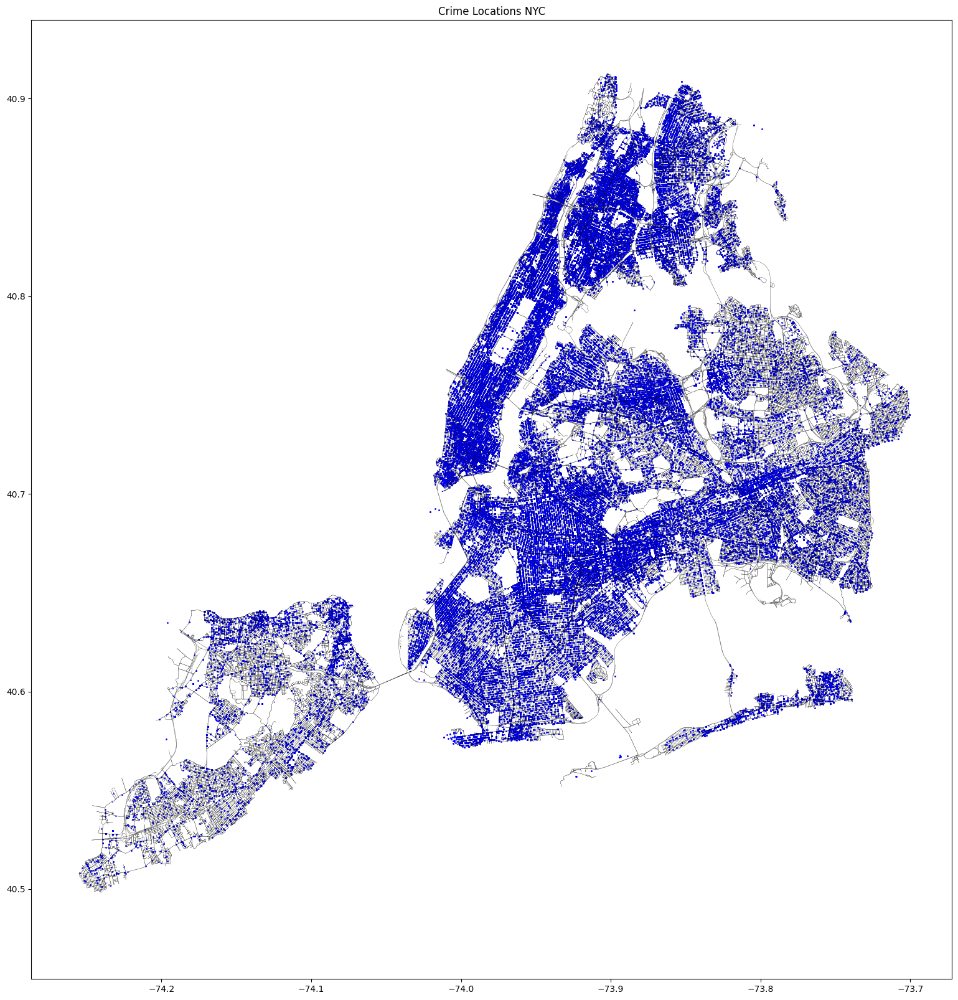

In [22]:
nodes, edges = ox.graph_to_gdfs(G)
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
crime_gdf_points.plot(ax=ax, markersize=1, color='blue')
plt.title("Crime Locations NYC")
plt.show()

In [23]:
crime_felony = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'FELONY']
crime_misdemeanor = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'MISDEMEANOR']
crime_violation = crime_gdf_points[crime_gdf_points['LAW_CAT_CD'] == 'VIOLATION']

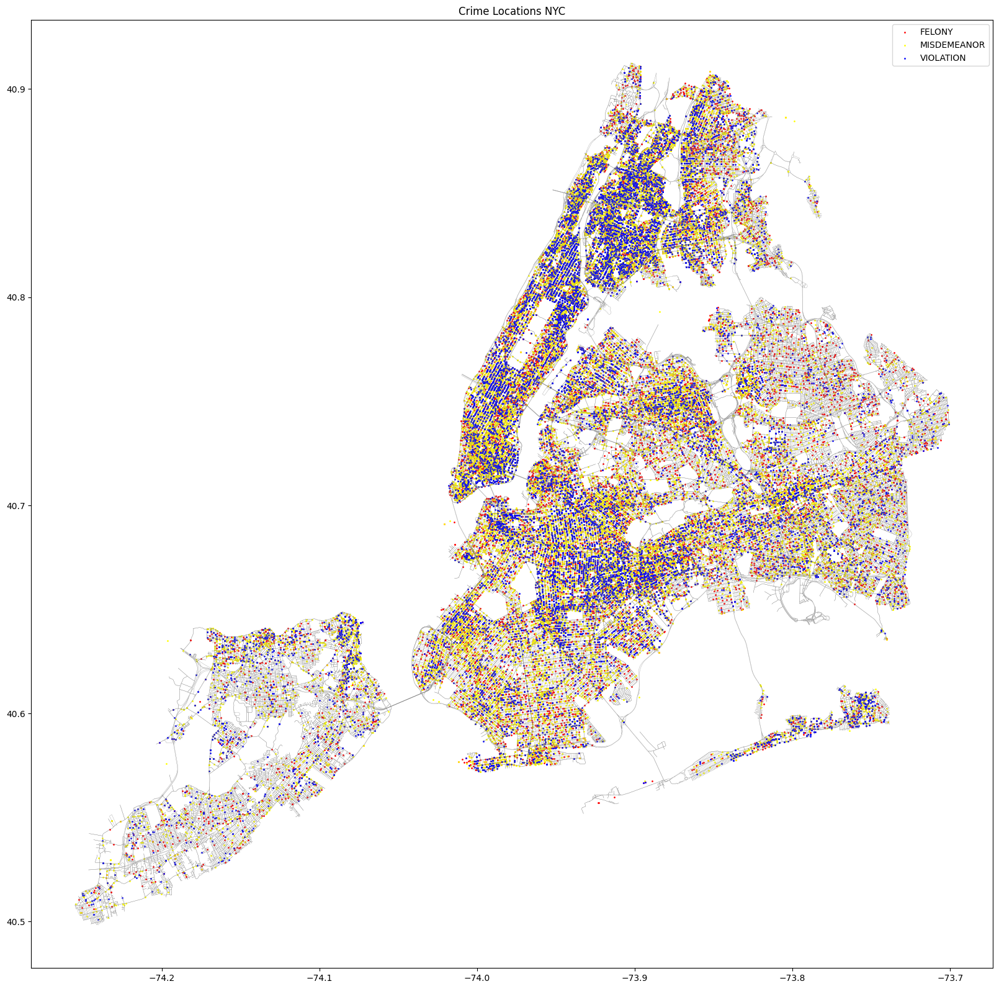

In [24]:
nodes, edges = ox.graph_to_gdfs(G) # extract edges

# Start plotting
fig, ax = plt.subplots(figsize=(20, 20))

# Plot filtered POIs
crime_felony.plot(ax=ax, color='red', markersize=1, label='FELONY')
crime_misdemeanor.plot(ax=ax, color='yellow', markersize=1, label='MISDEMEANOR')
crime_violation.plot(ax=ax, color='blue', markersize=1, label='VIOLATION')

edges.plot(ax=ax, linewidth=0.2, edgecolor='grey') # print edges
plt.title("Crime Locations NYC")
plt.legend()
plt.show()

In [25]:
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].is_empty]
crime_gdf_points = crime_gdf_points[~crime_gdf_points['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
crime_gdf_points.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,CRM_ATPT_CPTD_CD,JURIS_DESC,KY_CD,...,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon,New Georeferenced Column,geometry
0,282536052,79,BROOKLYN,02/15/2024,7:20:00,NaN,(null),COMPLETED,N.Y. POLICE DEPT,104,...,<18,UNKNOWN,F,999496.0,190300.0,40.689001,-73.945027,"(40.68900139556, -73.9450265328727)",POINT (-73.9450265328727 40.68900139556),POINT (-73.94503 40.68900)
1,282805297,42,BRONX,02/25/2024,12:24:00,NaN,(null),COMPLETED,N.Y. POLICE DEPT,578,...,45-64,BLACK,M,1013401.0,241248.0,40.828800,-73.894664,"(40.8288, -73.894664)",POINT (-73.894664 40.8288),POINT (-73.89466 40.82880)
2,280611665,105,QUEENS,01/16/2024,8:00:00,01/16/2024,8:10:00,COMPLETED,N.Y. POLICE DEPT,578,...,65+,WHITE,M,1062950.0,205790.0,40.731173,-73.716036,"(40.731173, -73.716036)",POINT (-73.716036 40.731173),POINT (-73.71604 40.73117)
3,284354345,68,BROOKLYN,03/25/2024,11:16:00,03/25/2024,16:00:00,COMPLETED,N.Y. POLICE DEPT,351,...,45-64,ASIAN / PACIFIC ISLANDER,M,980639.0,170223.0,40.633899,-74.013008,"(40.633899, -74.013008)",POINT (-74.013008 40.633899),POINT (-74.01301 40.63390)
4,282082987,17,MANHATTAN,02-12-2024,12:35:00,02-12-2024,12:40:00,COMPLETED,N.Y. POLICE DEPT,341,...,UNKNOWN,UNKNOWN,D,992155.0,213560.0,40.752848,-73.971465,"(40.752848, -73.971465)",POINT (-73.971465 40.752848),POINT (-73.97146 40.75285)


In [26]:
# Create a dictionary to map 'LAW_CAT_CD' values to 'crime' values
crime_map = {'FELONY': 1, 'MISDEMEANOR': 2, 'VIOLATION': 3}

# Add a new column 'crime' based on 'LAW_CAT_CD'
crime_gdf['crimes'] = crime_gdf['LAW_CAT_CD'].map(crime_map)

# Display the first few rows to verify
print(crime_gdf.head())

  CMPLNT_NUM  ADDR_PCT_CD    BORO_NM CMPLNT_FR_DT CMPLNT_FR_TM CMPLNT_TO_DT  \
0  282536052           79   BROOKLYN   02/15/2024      7:20:00          NaN   
1  282805297           42      BRONX   02/25/2024     12:24:00          NaN   
2  280611665          105     QUEENS   01/16/2024      8:00:00   01/16/2024   
3  284354345           68   BROOKLYN   03/25/2024     11:16:00   03/25/2024   
4  282082987           17  MANHATTAN   02-12-2024     12:35:00   02-12-2024   

  CMPLNT_TO_TM CRM_ATPT_CPTD_CD HADEVELOPT        JURIS_DESC  ...  \
0       (null)        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
1       (null)        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
2      8:10:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
3     16:00:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   
4     12:40:00        COMPLETED     (null)  N.Y. POLICE DEPT  ...   

                   VIC_RACE VIC_SEX X_COORD_CD Y_COORD_CD   Latitude  \
0                   UNKNOWN       F   

In [27]:
close_edges = ox.distance.nearest_edges(G, crime_gdf_points['geometry'].x, crime_gdf_points['geometry'].y)
crime_count = Counter(close_edges)

In [28]:
crimes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crime = crime_count[edges.loc[i].name]
    crimes.append(crime)

max_crashes = max(crimes)
edges['crimes'] = crimes

In [29]:
log_weights = np.log(edges['crimes']+1)
normalized_crimes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

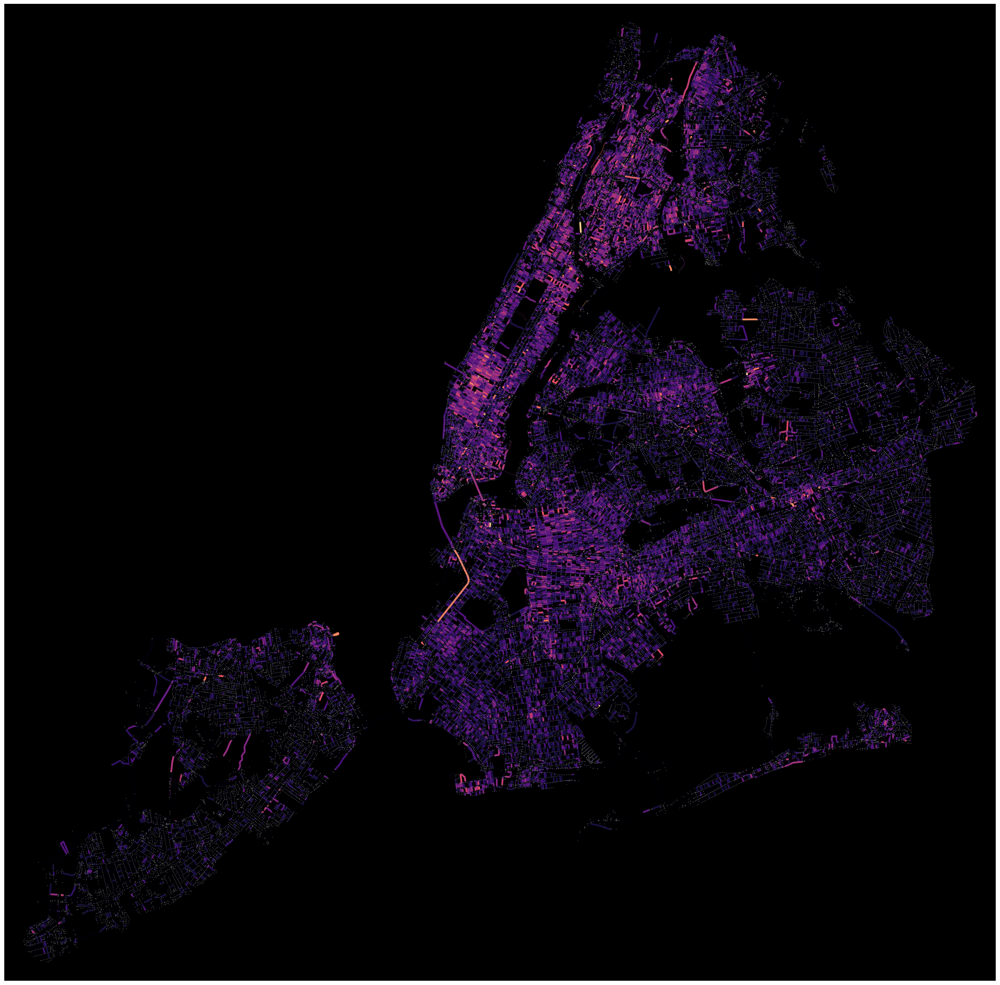

In [30]:
edges['normalized crime'] = normalized_crimes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crime', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 3 - Vehicular Crashes

https://data.cityofnewyork.us/Transportation/Serious-Injury-Response-Tracking-Analysis-Program-/xeqp-qz8h/about_data

Serious vehicular crashes that were analyzed and reported on as part of SIRTA.

In [31]:
vehicular_crashes = pd.read_csv("https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/Serious_Injury_Response__Tracking___Analysis_Program__SIRTA__20240521.csv")

In [32]:
geometry = gpd.points_from_xy(vehicular_crashes['Longitude'], vehicular_crashes['Latitude'])
crashes_gdf = gpd.GeoDataFrame(vehicular_crashes, geometry=geometry)
crashes_gdf.set_crs(epsg=4326, inplace=True)

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
1,4491159.0,01/01/2022,04:33,46.0,Bronx,0.0,1.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5568,4670978.0,09/29/2023,00:02,45.0,Bronx,0.0,1.0,0.0,40.838345,-73.84650,...,10461.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.84650 40.83834)
5569,4671179.0,09/16/2023,14:08,40.0,Bronx,0.0,1.0,0.0,40.804585,-73.91213,...,NaN,0.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91213 40.80459)
5570,4671610.0,09/29/2023,07:46,44.0,Bronx,0.0,1.0,0.0,40.839222,-73.91510,...,10452.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.91510 40.83922)
5571,4672556.0,09/11/2023,19:00,42.0,Bronx,0.0,1.0,0.0,40.822575,-73.90321,...,10456.0,0.0,2.0,203.0,17.0,2091959.0,2.026380e+09,133.0,BX0301,POINT (-73.90321 40.82258)


In [33]:
crashes_gdf_points = crashes_gdf[crashes_gdf['geometry'].type == 'Point']
crashes_gdf = crashes_gdf.dropna(subset=['geometry'])
crashes_gdf_points.head()

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
1,4491159.0,01/01/2022,04:33,46.0,Bronx,0.0,1.0,0.0,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT EMPTY
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)


In [34]:
print(len(crashes_gdf_points))

5573


In [35]:
print(crashes_gdf_points.duplicated(subset=['geometry']).sum())

1647


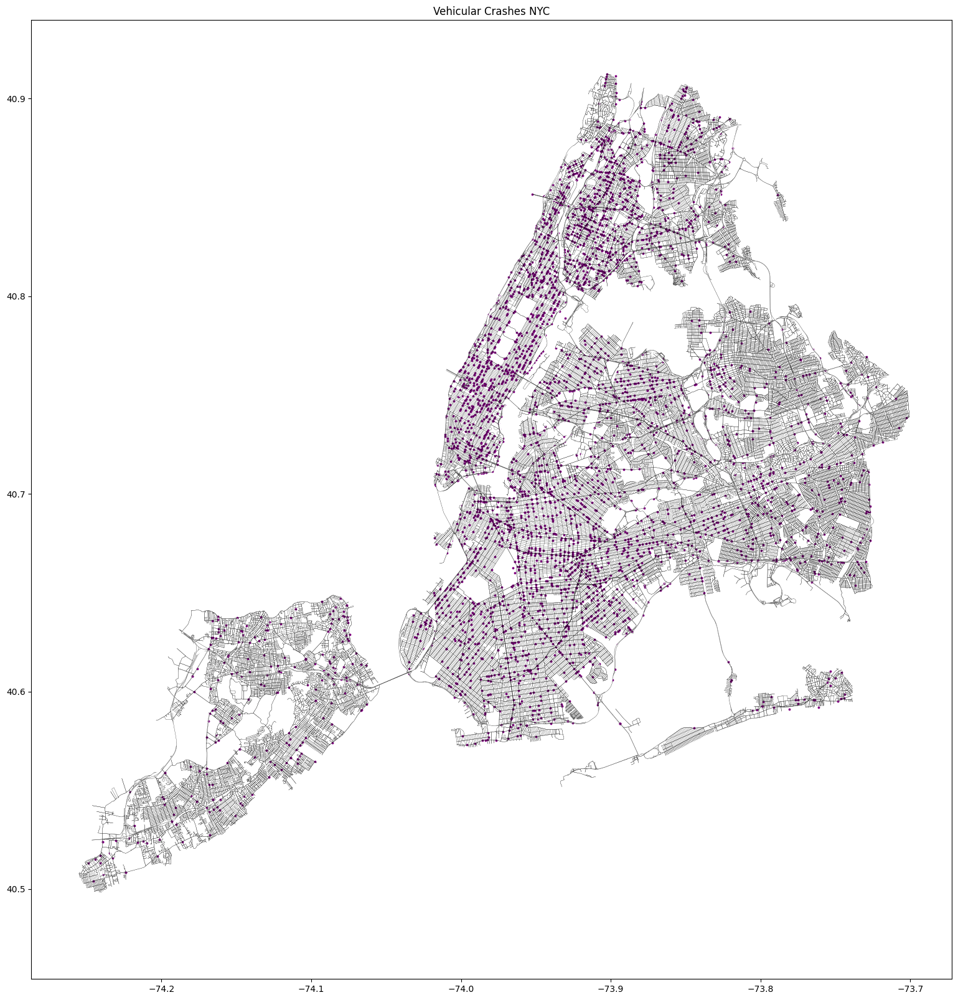

In [36]:
nodes, edges = ox.graph_to_gdfs(G)
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
crashes_gdf.plot(ax=ax, markersize=3, color='purple')
plt.title("Vehicular Crashes NYC")
plt.show()

In [37]:
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].is_empty]
crashes_gdf = crashes_gdf[~crashes_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
crashes_gdf.head()

,Collision ID,Crash Date,Crash Time,Crash Police Precinct,Crash Borough,Total Non-Severe Injuries,Total Severe Injuries,Total Fatalities,Latitude,Longitude,...,ZipCode,Similar Fatalities & Severe Injuries (3Y Lookback),Similar Fatalities & All Injuries (3Y Lookback),Community Board,Council District,Building Identification Number (BIN),Borough Block Lot (BBL),Census Tract (2020),Neighborhood Tabulation Area (NTA) (2020),geometry
0,4492364.0,01/01/2022,01:28,46.0,Bronx,1.0,1.0,0.0,40.858707,-73.90370,...,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.90370 40.85871)
2,4491487.0,01/01/2022,05:55,47.0,Bronx,0.0,1.0,0.0,40.871550,-73.86428,...,NaN,0.0,0.0,212.0,12.0,2056281.0,2.045980e+09,372.0,BX1201,POINT (-73.86428 40.87155)
3,4491223.0,01/01/2022,10:42,43.0,Bronx,0.0,1.0,0.0,40.823673,-73.87233,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.87233 40.82367)
4,4491418.0,01/01/2022,20:55,49.0,Bronx,0.0,1.0,0.0,40.863945,-73.86452,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.86452 40.86395)
6,4491529.0,01/02/2022,01:22,52.0,Bronx,0.0,0.0,1.0,40.882217,-73.88046,...,NaN,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,POINT (-73.88046 40.88222)


In [38]:
close_edges = ox.distance.nearest_edges(G, crashes_gdf['geometry'].x, crashes_gdf['geometry'].y)
crash_count = Counter(close_edges)

In [39]:
crashes = []

for i in edges.index:
    # Retrieve the number of crashes for the edge at position i
    crash = crash_count[edges.loc[i].name]
    crashes.append(crash)

max_crashes = max(crashes)
edges['crashes'] = crashes

In [40]:
log_weights = np.log(edges['crashes']+1)
normalized_crashes = (log_weights - log_weights.min()) / (log_weights.max() - log_weights.min())

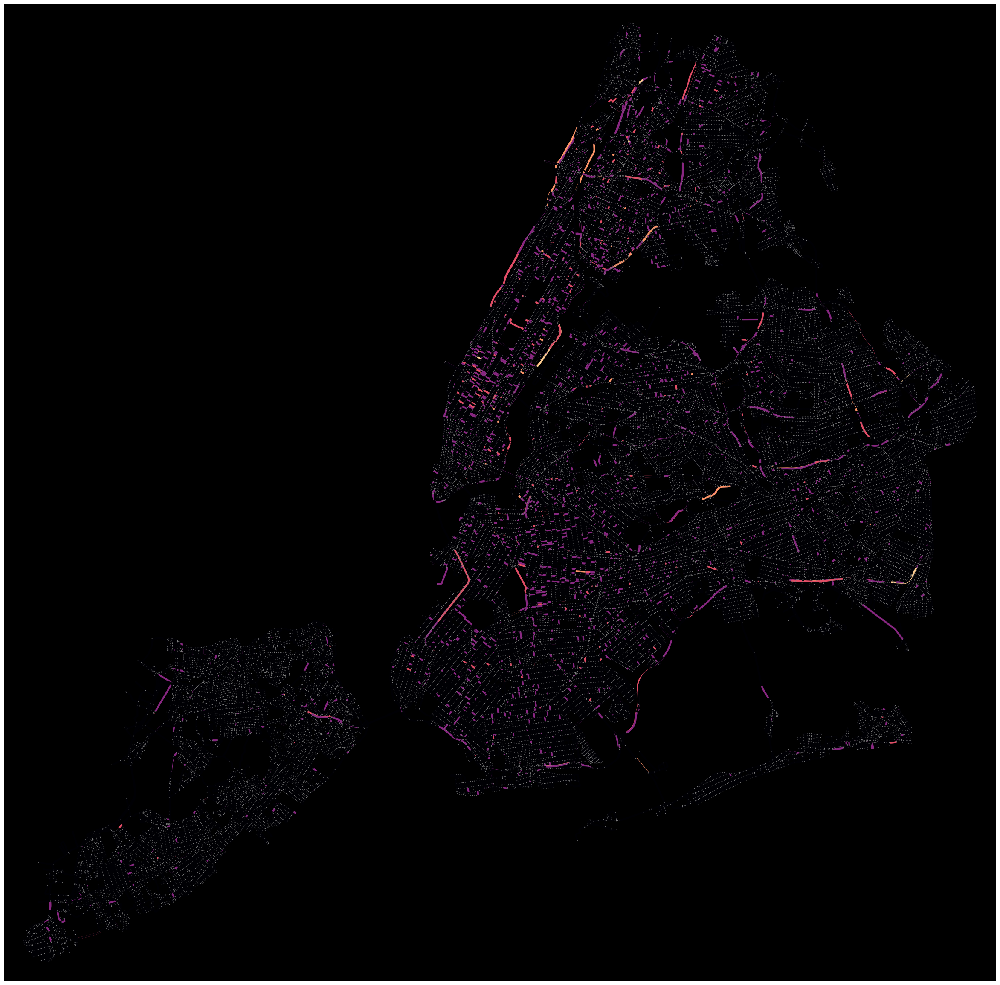

In [41]:
edges['normalized crashes'] = normalized_crashes

G = ox.graph_from_gdfs(nodes, edges)
ec = ox.plot.get_edge_colors_by_attr(G, attr = 'normalized crashes', cmap= 'magma')

fig, ax = ox.plot_graph(G, node_size=1, node_color = 'grey', edge_color=ec, edge_linewidth=3, figsize=(30,30), edge_alpha=1, bgcolor='black')

## Feature 4 - Fire Incidents

https://data.cityofnewyork.us/Public-Safety/Fire-Incident-Dispatch-Data/8m42-w767/about_data

The Fire Incident Dispatch Data file contains data that is generated by the Starfire Computer Aided Dispatch System. The data spans from the time the incident is created in the system to the time the incident is closed in the system. It covers information about the incident as it relates to the assignment of resources and the Fire Department’s response to the emergency.

https://data.cityofnewyork.us/Public-Safety/Emergency-Response-Incidents/pasr-j7fb/about_data

In [42]:
emergency_response = pd.read_csv("https://raw.githubusercontent.com/hetal-bharwani/graphML/main/Emergency_Response_Incidents_20240522.csv")

In [43]:
fire_incidents = emergency_response[emergency_response['Incident Type'].str.contains("fire", case=False, na=False)]

In [44]:
geometry = gpd.points_from_xy(fire_incidents['Longitude'], fire_incidents['Latitude'])
fire_gdf = gpd.GeoDataFrame(fire_incidents, geometry=geometry)
fire_gdf.set_crs(epsg=4326, inplace=True)

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
8,Fire-10-76 (Commercial High Rise Fire),130 East 57 Street,Manhattan,11/26/2016 05:45:43 AM,NaN,NaN,NaN,POINT EMPTY
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,POINT (-73.78401 40.59508)
...,...,...,...,...,...,...,...,...
11738,Fire-Other,NaN,Brooklyn,09/03/2015 03:30:43 AM,09/03/2015 03:30:43 AM,NaN,NaN,POINT EMPTY
11740,Fire-2nd Alarm,NaN,Brooklyn,01/23/2016 01:34:29 AM,01/23/2016 04:20:06 AM,NaN,NaN,POINT EMPTY
11743,Fire-10-77 (Residential High Rise Fire),72 Columbia Street,Manhattan,11/07/2016 12:40:50 PM,11/07/2016 12:49:16 PM,NaN,NaN,POINT EMPTY
11745,Fire-1st Alarm,NaN,Brooklyn,11/07/2016 05:09:53 PM,11/07/2016 08:09:32 PM,NaN,NaN,POINT EMPTY


In [45]:
minx, miny, maxx, maxy = -74.259090, 40.477399, -73.700272, 40.917577  # Example for New York City
bbox = box(minx, miny, maxx, maxy)

# Filter out points outside the bounding box
fire_gdf = fire_gdf[fire_gdf['geometry'].within(bbox)]

In [46]:
# Check the CRS of your fire_gdf and the bounding box
print("CRS of fire_gdf:", fire_gdf.crs)
bbox_crs = {'init': 'epsg:4326'}  # WGS 84
print("CRS of bounding box:", bbox_crs)

CRS of fire_gdf: EPSG:4326
CRS of bounding box: {'init': 'epsg:4326'}


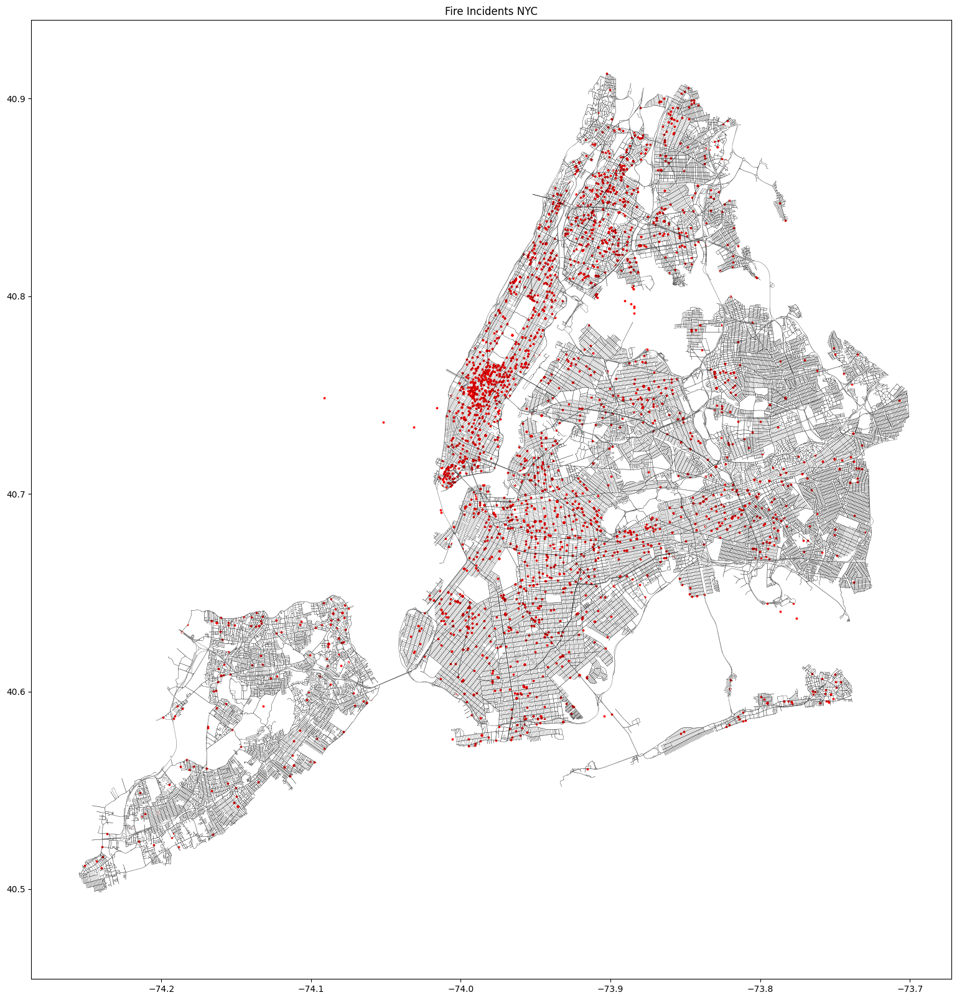

In [47]:
nodes, edges = ox.graph_to_gdfs(G)
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
fire_gdf.plot(ax=ax, markersize=3, color='red')
plt.title("Fire Incidents NYC")
plt.show()

In [48]:
fire_gdf = fire_gdf[~fire_gdf['geometry'].is_empty]
fire_gdf = fire_gdf[~fire_gdf['geometry'].apply(lambda geom: pd.isnull(geom.x) or pd.isnull(geom.y))]
fire_gdf.head()

,Incident Type,Location,Borough,Creation Date,Closed Date,Latitude,Longitude,geometry
6,Fire-2nd Alarm,238 East 24 Street,Manhattan,11/25/2016 04:06:09 AM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
10,Fire-2nd Alarm,24 Charles Street,Manhattan,12/14/2016 10:26:17 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)
11,Fire-3rd Alarm,581 3 ave,new york,11/30/2016 12:25:38 AM,11/30/2016 04:22:22 AM,40.667490,-73.994286,POINT (-73.99429 40.66749)
14,Fire-2nd Alarm,53-09 Beach Channel Drive,Far Rockaway,12/18/2016 05:52:37 PM,NaN,40.595083,-73.784005,POINT (-73.78401 40.59508)
15,Fire-1st Alarm,151 West 100 Street,Manhattan,12/23/2016 01:36:49 PM,NaN,40.714422,-74.006076,POINT (-74.00608 40.71442)


In [49]:
print(len(fire_gdf))

3764


## Feature 5 - Traffic

https://www.dot.ny.gov/tdv

Annual Average Daily Traffic (AADT) and additional traffic statistics for a Traffic Station. The Route Network layer provides a visual representation of Traffic Station segments. The Traffic Station location points provide details for individual counts at the specific location of data collection.

- Vehicle volume, classification, and speed data
- Annual Average Daily Traffic (AADT)
- Truck AADT and Truck Percentage
- Location of historical short count sites

https://data.cityofnewyork.us/Transportation/Traffic-Volume-Counts/btm5-ppia/about_data

https://data.cityofnewyork.us/City-Government/LION/2v4z-66xt/about_data

New York City Department of Transportation (NYC DOT) uses Automated Traffic Recorders (ATR) to collect traffic sample volume counts at bridge crossings and roadways.

In [50]:
#from google.colab import drive
#drive.mount('/content/drive')

In [51]:
#gdb_path = '/content/drive/MyDrive/Colab Notebooks/AADT_2021.gdb'

In [52]:
pcs = "EPSG:2263"
G=ox.project_graph(G,to_crs=pcs)

In [53]:
nodes, edges = ox.graph_to_gdfs(G)

In [54]:
boundary = ox.geocode_to_gdf(place_name)
boundary=ox.projection.project_gdf(boundary, to_crs=pcs, to_latlong=False)

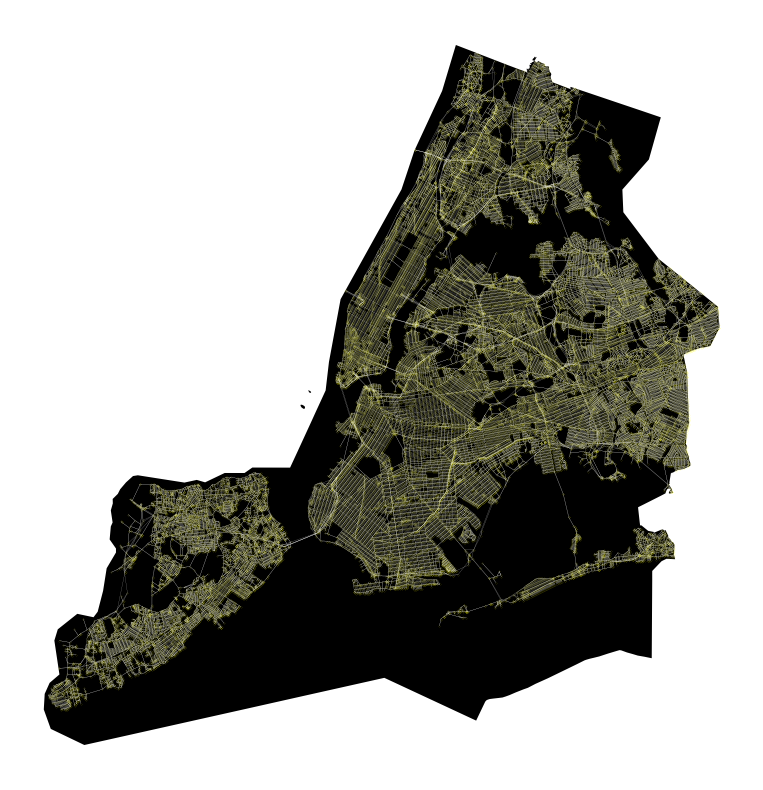

In [55]:
fig, ax = plt.subplots(figsize=(10,10))
boundary.plot(ax=ax, facecolor='black')
edges.plot(ax=ax, linewidth=0.1, edgecolor='black')
nodes.plot(ax=ax, color='yellow', markersize=0.003)
plt.axis("off")
plt.show()

In [152]:
import pandas as pd
from geopy.geocoders import Nominatim
from shapely.geometry import LineString


# URL to the raw CSV file on GitHub
url = 'https://raw.githubusercontent.com/NaveenKumar-ar/GraphML_Repo/main/02-Datasets/Geo-Traffic%20data/Traffic_Volume_Counts_20240515.csv'

# Load the dataset from GitHub
data = pd.read_csv(url)
# data = data.iloc[:100]

,ID,SegmentID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,1,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-09-2012,20.0,10.0,11.0,...,104.0,105.0,147.0,120.0,91.0,83.0,74.0,49.0,42.0,42.0
1,2,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-10-2012,21.0,16.0,8.0,...,102.0,98.0,133.0,131.0,95.0,73.0,70.0,63.0,42.0,35.0
2,3,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-11-2012,27.0,14.0,6.0,...,115.0,115.0,130.0,143.0,106.0,89.0,68.0,64.0,56.0,43.0
3,4,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-12-2012,22.0,7.0,7.0,...,71.0,127.0,122.0,144.0,122.0,76.0,64.0,58.0,64.0,43.0
4,5,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/13/2012,31.0,17.0,7.0,...,113.0,126.0,133.0,135.0,102.0,106.0,58.0,58.0,55.0,54.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42751,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/18/2020,68.0,63.0,31.0,...,152.0,177.0,162.0,164.0,183.0,173.0,143.0,113.0,127.0,133.0
42752,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/19/2020,71.0,59.0,42.0,...,166.0,162.0,187.0,182.0,180.0,190.0,162.0,155.0,234.0,166.0
42753,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/20/2020,111.0,79.0,54.0,...,157.0,186.0,170.0,158.0,194.0,196.0,222.0,174.0,182.0,178.0
42754,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/21/2020,129.0,95.0,63.0,...,139.0,147.0,153.0,183.0,163.0,184.0,183.0,169.0,187.0,211.0


In [153]:
morning_hours = ['5:00-6:00AM', '6:00-7:00AM', '7:00-8:00AM', '8:00-9:00AM', '9:00-10:00AM', '10:00-11:00AM', '11:00-12:00PM']
afternoon_hours = ['12:00-1:00PM', '1:00-2:00PM', '2:00-3:00PM', '3:00-4:00PM', '4:00-5:00PM']
evening_hours = ['5:00-6:00PM', '6:00-7:00PM', '7:00-8:00PM', '8:00-9:00PM', '9:00-10:00PM', '10:00-11:00PM', '11:00-12:00AM']

# Sum vehicle counts for each period
data['morning'] = data[morning_hours].sum(axis=1)
data['afternoon'] = data[afternoon_hours].sum(axis=1)
data['evening'] = data[evening_hours].sum(axis=1)

,ID,SegmentID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM,morning,afternoon,evening
0,1,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-09-2012,20.0,10.0,11.0,...,120.0,91.0,83.0,74.0,49.0,42.0,42.0,425.0,535.0,501.0
1,2,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-10-2012,21.0,16.0,8.0,...,131.0,95.0,73.0,70.0,63.0,42.0,35.0,350.0,501.0,509.0
2,3,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-11-2012,27.0,14.0,6.0,...,143.0,106.0,89.0,68.0,64.0,56.0,43.0,402.0,539.0,569.0
3,4,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01-12-2012,22.0,7.0,7.0,...,144.0,122.0,76.0,64.0,58.0,64.0,43.0,405.0,528.0,571.0
4,5,15540,BEACH STREET,UNION PLACE,VAN DUZER STREET,NB,01/13/2012,31.0,17.0,7.0,...,135.0,102.0,106.0,58.0,58.0,55.0,54.0,445.0,573.0,568.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42751,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/18/2020,68.0,63.0,31.0,...,164.0,183.0,173.0,143.0,113.0,127.0,133.0,1145.0,787.0,1036.0
42752,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/19/2020,71.0,59.0,42.0,...,182.0,180.0,190.0,162.0,155.0,234.0,166.0,967.0,826.0,1269.0
42753,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/20/2020,111.0,79.0,54.0,...,158.0,194.0,196.0,222.0,174.0,182.0,178.0,948.0,845.0,1304.0
42754,373,35832,WEST 49th STREET,Rockefeller Plaza,6th Avenue,WB,11/21/2020,129.0,95.0,63.0,...,183.0,163.0,184.0,183.0,169.0,187.0,211.0,477.0,659.0,1280.0


In [166]:
# Aggregate the vehicle data by SegmentID, From, and To
aggregated_data = data.groupby(['SegmentID', 'Roadway Name', 'From', 'To', ]).agg({
    'morning': 'sum',
    'afternoon': 'sum',
    'evening': 'sum'
}).reset_index()

aggregated_data

,SegmentID,Roadway Name,From,To,morning,afternoon,evening
0,202,Main Street,Hoover Avenue,82 Drive,2932.0,3236.0,4375.0
1,646,ARTHUR KILL ROAD,WINANT PLACE,MANLEY STREET,8917.0,10958.0,6450.0
2,1416,BLOOMINGDALE ROAD,RAMONA AVENUE,HARGOLD AVENUE,25364.0,30362.0,26924.0
3,1421,BLOOMINGDALE ROAD,RAMONA AVENUE,SONIA COURT,12538.0,13833.0,12525.0
4,1883,FOSTER ROAD,RAMONA AVENUE,RATHBUN AVENUE,3255.0,3550.0,3179.0
...,...,...,...,...,...,...,...
3201,9017020,5 AVENUE,East 101th Street,Gustave L Levy Place,37200.0,34171.0,33983.0
3202,9017020,5 Avenue,101 Street,Gustave L Levy Place,55871.0,50520.0,54099.0
3203,9017037,Queens Boulevard,82 Avenue,80 Road,49521.0,35360.0,32501.0
3204,9017039,Queens Boulevard,82 Avenue,80 Road,36105.0,51289.0,56246.0


In [175]:
# Initialize a geocoder
geolocator = Nominatim(user_agent="my_geocoder")

# Function to geocode an address to coordinates
def geocode_address(address):
    try:
        location = geolocator.geocode(address)
        return (location.latitude, location.longitude)
    except:
        return None

# Geocode the 'From' and 'To' columns
aggregated_data['from_coords'] = aggregated_data['From'].apply(geocode_address)
aggregated_data['to_coords'] = aggregated_data['To'].apply(geocode_address)

# Drop rows with missing coordinates
aggregated_data = aggregated_data.dropna(subset=['from_coords', 'to_coords'])

# Create LineString objects from the 'from_coords' and 'to_coords' columns
aggregated_data['geometry'] = aggregated_data.apply(lambda row: LineString([row['from_coords'], row['to_coords']]), axis=1)

# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(aggregated_data, geometry='geometry')

# Display the GeoDataFrame
gdf


In [172]:
# Geocode the "From" and "To" addresses
aggregated_data['from_coords'] = aggregated_data['From'].apply(geocode_address)
aggregated_data['to_coords'] = aggregated_data['To'].apply(geocode_address)

# Create LineString geometries for each edge
aggregated_data['geometry'] = aggregated_data.apply(lambda row: LineString([row['from_coords'], row['to_coords']]), axis=1)

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(aggregated_data, geometry='geometry')

# Display the GeoDataFrame  
gdf

KeyboardInterrupt: 

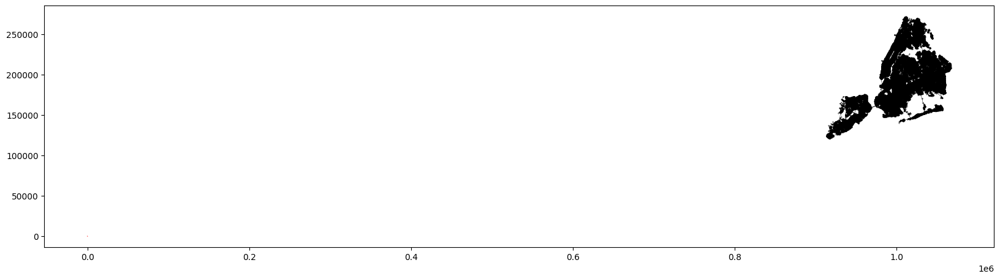

In [142]:
NY = ox.graph_from_place('New York, United States', network_type='drive',simplify=True)

# Plot the base graph
fig, ax = plt.subplots(figsize=(20, 20))
area.plot(ax = ax, facecolor = 'White')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'Black', facecolor = 'white')
nodes.plot(ax= ax, color = 'Black', markersize = 0.1)

# Plot the street segments on top of the map
gdf.plot(ax=ax, color='red', linewidth=0.1)

# Show the plot
plt.show()

In [95]:
lion_data = lion_data.iloc[5000:6000]

# Function to find edge by street names

def find_edge_by_street_names(graph, from_street, to_street):
    for u, v, key, data in graph.edges(keys=True, data=True):
        if from_street in data.get('name', '') and to_street in data.get('name', ''):
            return (u, v, key)
    return None

# Add columns for OSMNX segment information
lion_data['osmid'] = None
lion_data['u'] = None
lion_data['v'] = None

# Find and append the corresponding OSMNX segments
for idx, row in lion_data.iterrows():
    edge = find_edge_by_street_names(G, row['From'], row['To'])
    if edge:
        lion_data.at[idx, 'osmid'] = G.edges[edge].get('osmid')
        lion_data.at[idx, 'u'] = edge[0]
        lion_data.at[idx, 'v'] = edge[1]

# Display the first few rows of the dataset
print(lion_data.head())
nodes, edges = ox.graph_to_gdfs(G)

Empty DataFrame
Columns: [ID, SegmentID, Roadway Name, From, To, Direction, Date, 12:00-1:00 AM, 1:00-2:00AM, 2:00-3:00AM, 3:00-4:00AM, 4:00-5:00AM, 5:00-6:00AM, 6:00-7:00AM, 7:00-8:00AM, 8:00-9:00AM, 9:00-10:00AM, 10:00-11:00AM, 11:00-12:00PM, 12:00-1:00PM, 1:00-2:00PM, 2:00-3:00PM, 3:00-4:00PM, 4:00-5:00PM, 5:00-6:00PM, 6:00-7:00PM, 7:00-8:00PM, 8:00-9:00PM, 9:00-10:00PM, 10:00-11:00PM, 11:00-12:00AM, osmid, u, v]
Index: []

[0 rows x 34 columns]


C:\Users\pingn\AppData\Local\Temp\ipykernel_12024\1160355738.py:7: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  matched_edges.plot(ax=ax, color='red', linewidth=2)


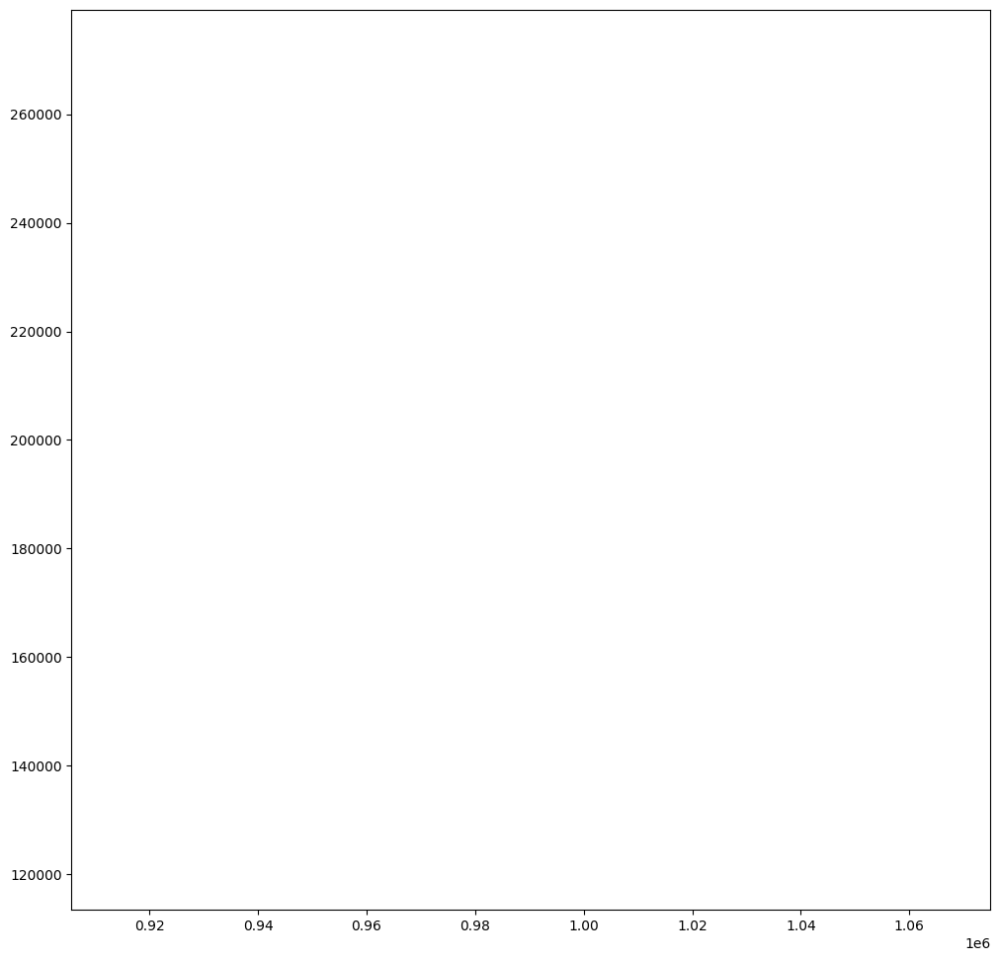

In [92]:
# Filter the edges GeoDataFrame to only include matched segments
matched_edges = edges[edges.index.isin(lion_data[['u', 'v']].dropna().apply(tuple, axis=1))]


# Plot the street network and the matched segments
fig, ax = plt.subplots(figsize=(12, 12))
area.plot(ax = ax, facecolor = 'white')
edges.plot(ax = ax, linewidth = 0.2, edgecolor = 'black', facecolor = 'white')
nodes.plot(ax= ax, color = 'white', markersize = .1)
edges.plot(ax=ax, linewidth=1, edgecolor='white')
matched_edges.plot(ax=ax, color='red', linewidth=2)

plt.show()

In [ ]:
osm_crs=G.graph["crs"]  #coordinate system
osm_crs

In [ ]:
ac_streets=ox.projection.project_gdf(ac_streets, to_crs=osm_crs, to_latlong=False) #https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.projection.project_gdf
ac_streets  #after projection -> this is an edges geodataframe that has information about the geometry

In [ ]:
url_traffic = "https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/Traffic_Volume_Counts_20240524.csv"
urllib.request.urlretrieve(url_traffic, 'nyc_traffic_volume_counts.csv')

In [ ]:
ftraffic = pd.read_csv('nyc_traffic_volume_counts.csv')

In [ ]:
print(df_traffic.head())

In [ ]:
print(df_traffic.dtypes)

## Traffic test for Manhattan

In [58]:
traffic_df = pd.read_csv("https://raw.githubusercontent.com/ManolyaLN/GraphML_Repo/Manolya/02-Datasets/points_with_community.csv")

In [59]:
geometry = [Point(xy) for xy in zip(traffic_df.longitude, traffic_df.latitude)]

In [60]:
gdf = gpd.GeoDataFrame(traffic_df, geometry=geometry)

In [61]:
print(gdf.head())

    latitude  longitude  sub-district  traffic_density  \
0  40.684791 -74.021912          24.0        90.978964   
1  40.685139 -74.021137          24.0        90.978964   
2  40.685550 -74.020236          24.0        90.978964   
3  40.685824 -74.025872          24.0        90.978964   
4  40.685994 -74.025888          24.0        90.978964   

                     geometry  
0  POINT (-74.02191 40.68479)  
1  POINT (-74.02114 40.68514)  
2  POINT (-74.02024 40.68555)  
3  POINT (-74.02587 40.68582)  
4  POINT (-74.02589 40.68599)  


In [62]:
gdf.set_crs(epsg=4326, inplace=True)

,latitude,longitude,sub-district,traffic_density,geometry
0,40.684791,-74.021912,24.0,90.978964,POINT (-74.02191 40.68479)
1,40.685139,-74.021137,24.0,90.978964,POINT (-74.02114 40.68514)
2,40.685550,-74.020236,24.0,90.978964,POINT (-74.02024 40.68555)
3,40.685824,-74.025872,24.0,90.978964,POINT (-74.02587 40.68582)
4,40.685994,-74.025888,24.0,90.978964,POINT (-74.02589 40.68599)
...,...,...,...,...,...
995,40.871043,-73.915746,4.0,527.553424,POINT (-73.91575 40.87104)
996,40.871161,-73.914010,4.0,31.511706,POINT (-73.91401 40.87116)
997,40.871655,-73.911227,4.0,31.511706,POINT (-73.91123 40.87166)
998,40.873237,-73.911515,4.0,31.511706,POINT (-73.91152 40.87324)


In [63]:
gdf.to_file("output_file.gpkg", driver="GPKG")

In [100]:
url = "https://github.com/ManolyaLN/GraphML_Repo/raw/Manolya/02-Datasets/output_file.gpkg"
urllib.request.urlretrieve(url, 'file_1.gpkg')
url_p1='/content/file_1.gpkg'

In [101]:
points_gdf = gpd.read_file(url)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
print("Original CRS:", points_gdf.crs)

In [ ]:
pcs = "EPSG:2263"  # NAD83 / New York Long Island

In [ ]:
points_gdf = points_gdf.to_crs(pcs)

In [ ]:
print("Columns in the GeoDataFrame:")
print(points_gdf.columns)

In [ ]:
polygons_list = []

In [ ]:
for name, group in points_gdf.groupby('sub-district'):
    # Create a MultiPoint object from the group
    multipoint = MultiPoint(group.geometry.tolist())
    # Create a convex hull polygon from the MultiPoint object
    polygon = multipoint.convex_hull
    # Create a dictionary with sub_district, traffic_density, and geometry
    polygon_dict = {
        'sub-district': name,
        'traffic_density': group['traffic_density'].mean(),  # Calculate average traffic density
        'geometry': polygon
    }
    polygons_list.append(polygon_dict)

In [ ]:
polygons_gdf = gpd.GeoDataFrame(polygons_list, crs=points_gdf.crs)

In [ ]:
print(polygons_gdf.head())
polygons_gdf.plot(column='traffic_density', legend=True)
plt.axis("off")
plt.title("Traffic Density by Sub-District", fontsize=10)
plt.show()

## All Features with Graph

# Check Correlation

In [ ]:
pip install phik

In [ ]:
import phik
from phik.report import plot_correlation_matrix
from phik import report
import seaborn as sns
import warnings

In [ ]:
attributes_to_check = ['attributes_01_0', 'attributes_01_1', 'attributes_01_2', 'attributes_01_3', 'attributes_02', 'attributes_03_0', 'attributes_03_1', 'attributes_03_2']
data_to_check = nodes[attributes_to_check]

In [ ]:
warnings.filterwarnings("ignore")

plt.figure(figsize=(10, 5))
heatmap = sns.heatmap(data_to_check.phik_matrix(), annot=True);
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

# Assigning Classes

Describe what will be your classification criteria --

Load dataset or alternative data strategy

Assign classes to node/edges

Plot classes with graph

# DGL Graph

Include features and classes as attributes to the city Graph

Convert networkx graph to DGL graph

Add features to DGL graph

In [ ]:
#Get dgl graph
graph=dgl.from_networkx(G, node_attrs=nodes_attributes_list)

In [ ]:
graph

In [ ]:
graph.ndata